In [1]:
import scanpy as sc
import surgeon
import numpy as np

Using TensorFlow backend.


In [2]:
sc.settings.set_figure_params(dpi=200)

In [3]:
condition_key = "study"
cell_type_key = 'cell_type'
target_conditions = ["Drop-seq", "inDrops"]
target_cell_types = ['NK']

# Loading 6 PBMC datasets and data preparation

In [4]:
adata = sc.read("./data/pbmc/pbmc_count.h5ad")
adata

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


AnnData object with n_obs × n_vars = 107248 × 1793 
    obs: 'CBC', 'CellType', 'Experiment', 'Method', 'batch', 'bulk_labels', 'cell_type', 'louvain', 'method', 'n_counts', 'n_genes', 'percent_mito', 'study'
    var: 'ENS-0', 'Name-0', 'gene_ids-1', 'n_counts-2', 'gene_ids-3', 'n_cells-3', 'highly_variable-3', 'means-3', 'dispersions-3', 'dispersions_norm-3'
    uns: 'cell_type_colors', 'neighbors', 'study_colors'
    obsm: 'X_pca', 'X_umap'

## Number of cells in each batch

In [5]:
adata.obs[condition_key].value_counts()

10x PBMC 68k         68579
10X_3prime            8098
10X_5prime            7378
inDrops               6584
Drop-seq              6584
10x Chromium V2 B     3222
10x Chromium V2 A     3222
10x PBMC 3k           2638
Smart-seq2             526
CEL-Seq2               417
Name: study, dtype: int64

## visualization  of the original data

In [7]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

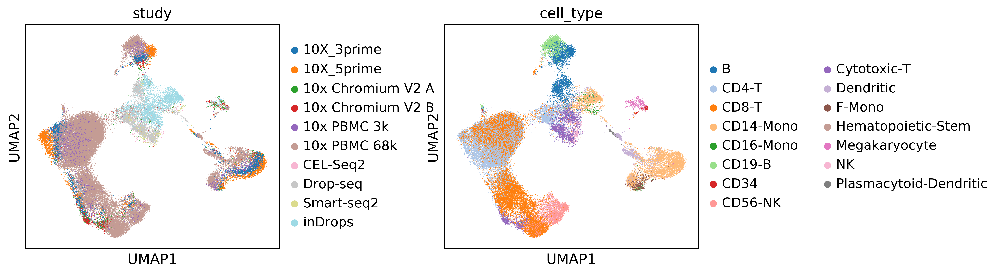

In [8]:
sc.pl.umap(adata, color=[condition_key, cell_type_key], wspace=0.5)

## Now we leave out some studies for training the newtork

In [6]:
adata_for_training = adata[~adata.obs[condition_key].isin(target_conditions)]
adata_for_training

View of AnnData object with n_obs × n_vars = 94080 × 1793 
    obs: 'CBC', 'CellType', 'Experiment', 'Method', 'batch', 'bulk_labels', 'cell_type', 'louvain', 'method', 'n_counts', 'n_genes', 'percent_mito', 'study'
    var: 'ENS-0', 'Name-0', 'gene_ids-1', 'n_counts-2', 'gene_ids-3', 'n_cells-3', 'highly_variable-3', 'means-3', 'dispersions-3', 'dispersions_norm-3'
    uns: 'cell_type_colors', 'neighbors', 'study_colors'
    obsm: 'X_pca', 'X_umap'

In [7]:
adata_for_training = adata_for_training[~adata_for_training.obs[cell_type_key].isin(target_cell_types)]
adata_for_training

View of AnnData object with n_obs × n_vars = 92814 × 1793 
    obs: 'CBC', 'CellType', 'Experiment', 'Method', 'batch', 'bulk_labels', 'cell_type', 'louvain', 'method', 'n_counts', 'n_genes', 'percent_mito', 'study'
    var: 'ENS-0', 'Name-0', 'gene_ids-1', 'n_counts-2', 'gene_ids-3', 'n_cells-3', 'highly_variable-3', 'means-3', 'dispersions-3', 'dispersions_norm-3'
    uns: 'cell_type_colors', 'neighbors', 'study_colors'
    obsm: 'X_pca', 'X_umap'

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


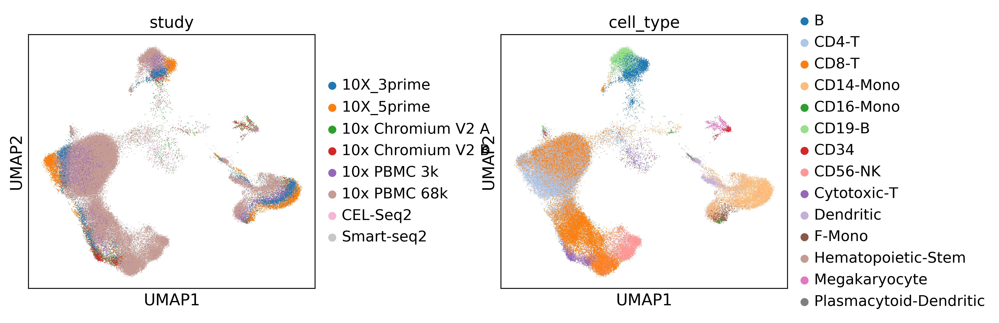

In [11]:
sc.pl.umap(adata_for_training, color=[condition_key, cell_type_key], wspace=0.5)

In [8]:
adata_out_of_sample = adata[adata.obs[condition_key].isin(target_conditions)]
adata_out_of_sample

View of AnnData object with n_obs × n_vars = 13168 × 1793 
    obs: 'CBC', 'CellType', 'Experiment', 'Method', 'batch', 'bulk_labels', 'cell_type', 'louvain', 'method', 'n_counts', 'n_genes', 'percent_mito', 'study'
    var: 'ENS-0', 'Name-0', 'gene_ids-1', 'n_counts-2', 'gene_ids-3', 'n_cells-3', 'highly_variable-3', 'means-3', 'dispersions-3', 'dispersions_norm-3'
    uns: 'cell_type_colors', 'neighbors', 'study_colors'
    obsm: 'X_pca', 'X_umap'

## Normalization

In [9]:
adata_for_training = surgeon.utils.normalize(adata_for_training, 
                                             filter_min_counts=False, 
                                             normalize_input=False, 
                                             size_factors=True,
                                             logtrans_input=True,
                                             n_top_genes=5000,
                                            )

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Trying to set attribute `.obs` of view, making a copy.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [10]:
adata_out_of_sample = surgeon.utils.normalize(adata_out_of_sample, 
                                              filter_min_counts=False, 
                                              normalize_input=False, 
                                              size_factors=True,
                                              logtrans_input=True,
                                              n_top_genes=5000,
                                             )

Trying to set attribute `.obs` of view, making a copy.


## Train/Test Split

In [11]:
train_adata, valid_adata = surgeon.utils.train_test_split(adata_for_training, 0.85)

In [12]:
train_adata.shape, valid_adata.shape

((78891, 1793), (13923, 1793))

In [13]:
n_conditions = len(train_adata.obs[condition_key].unique().tolist())

# Create & Train model with training data

In [14]:
network = surgeon.archs.CVAE(x_dimension=train_adata.shape[1], 
                             z_dimension=20,
                             n_conditions=n_conditions,
                             lr=0.001,
                             alpha=0.0001,
                             scale_factor=10.0,
                             clip_value=5.0,
                             loss_fn='nb',
                             model_path=f"./models/OutOfSample/Before-PBMC-{target_cell_types[0]}/",
                             dropout_rate=0.2,
                             )

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


/home/mohsen/scnet/surgeon/models/_cvae.py:149: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=[<tf.Tenso..., outputs=Tensor("de...)`
  output=h_disp)


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
data (InputLayer)               (None, 1793)         0                                            
__________________________________________________________________________________________________
encoder_labels (InputLayer)     (None, 8)            0                                            
__________________________________________________________________________________________________
concatenate_1 (Concatenate)     (None, 1801)         0           data[0][0]                       
                                                                 encoder_labels[0][0]             
__________________________________________________________________________________________________
first_layer (Dense)             (None, 512)          922112      concatenate_1[0][0]              
__________

## We assign each study to a numerical label 

In [15]:
conditions = adata_for_training.obs[condition_key].unique().tolist()
condition_encoder = surgeon.utils.create_dictionary(conditions, target_conditions)
condition_encoder

{'10x Chromium V2 A': 0,
 '10x Chromium V2 B': 1,
 'CEL-Seq2': 2,
 'Smart-seq2': 3,
 '10X_5prime': 4,
 '10X_3prime': 5,
 '10x PBMC 68k': 6,
 '10x PBMC 3k': 7}

## Training the network

In [17]:
network.train(train_adata,
              valid_adata, 
              condition_key=condition_key,
              le=condition_encoder, 
              n_epochs=10000,
              batch_size=32, 
              early_stop_limit=50,
              lr_reducer=40,
              n_per_epoch=0,
              save=True, 
              verbose=2)

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Or pass `index_unique!=None` to `.concatenate`.


Train on 78891 samples, validate on 13923 samples
Epoch 1/10000
 - 18s - loss: 0.2739 - nb: 0.2739 - val_loss: 0.2531 - val_nb: 0.2531
Epoch 2/10000
 - 15s - loss: 0.2569 - nb: 0.2569 - val_loss: 0.2498 - val_nb: 0.2498
Epoch 3/10000
 - 16s - loss: 0.2539 - nb: 0.2539 - val_loss: 0.2484 - val_nb: 0.2484
Epoch 4/10000
 - 16s - loss: 0.2526 - nb: 0.2526 - val_loss: 0.2484 - val_nb: 0.2484
Epoch 5/10000
 - 16s - loss: 0.2519 - nb: 0.2519 - val_loss: 0.2477 - val_nb: 0.2477
Epoch 6/10000
 - 16s - loss: 0.2514 - nb: 0.2514 - val_loss: 0.2472 - val_nb: 0.2472
Epoch 7/10000
 - 16s - loss: 0.2510 - nb: 0.2510 - val_loss: 0.2469 - val_nb: 0.2469
Epoch 8/10000
 - 17s - loss: 0.2507 - nb: 0.2507 - val_loss: 0.2469 - val_nb: 0.2469
Epoch 9/10000
 - 16s - loss: 0.2504 - nb: 0.2504 - val_loss: 0.2467 - val_nb: 0.2467
Epoch 10/10000
 - 16s - loss: 0.2502 - nb: 0.2502 - val_loss: 0.2464 - val_nb: 0.2464
Epoch 11/10000
 - 16s - loss: 0.2501 - nb: 0.2501 - val_loss: 0.2465 - val_nb: 0.2465
Epoch 12/1000

In [18]:
network.condition_encoder

{'10x Chromium V2 A': 0,
 '10x Chromium V2 B': 1,
 'CEL-Seq2': 2,
 'Smart-seq2': 3,
 '10X_5prime': 4,
 '10X_3prime': 5,
 '10x PBMC 68k': 6,
 '10x PBMC 3k': 7}

In [19]:
encoder_labels, _ = surgeon.utils.label_encoder(
    adata_for_training, label_encoder=network.condition_encoder, condition_key=condition_key)

In [20]:
latent_adata = network.to_latent(adata_for_training, encoder_labels)
latent_adata

AnnData object with n_obs × n_vars = 92814 × 20 
    obs: 'CBC', 'CellType', 'Experiment', 'Method', 'batch', 'bulk_labels', 'cell_type', 'louvain', 'method', 'n_counts', 'n_genes', 'percent_mito', 'study', 'size_factors'

In [21]:
sc.pp.neighbors(latent_adata)
sc.tl.umap(latent_adata)

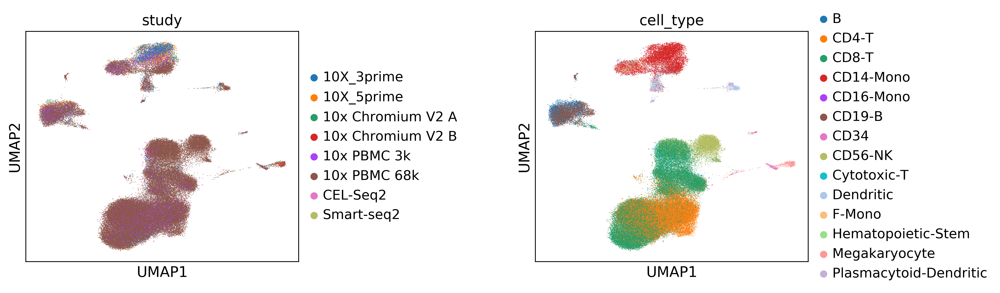

In [22]:
sc.pl.umap(latent_adata, color=[condition_key, cell_type_key], wspace=0.7)

# Perfroming architecture Surgery

In [23]:
new_network = surgeon.operate(network, 
                              new_conditions=target_conditions,
                              init='Xavier', 
                              freeze=True)

/home/mohsen/scnet/surgeon/models/_cvae.py:149: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=[<tf.Tenso..., outputs=Tensor("de...)`
  output=h_disp)


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
data (InputLayer)               (None, 1793)         0                                            
__________________________________________________________________________________________________
encoder_labels (InputLayer)     (None, 10)           0                                            
__________________________________________________________________________________________________
concatenate_3 (Concatenate)     (None, 1803)         0           data[0][0]                       
                                                                 encoder_labels[0][0]             
__________________________________________________________________________________________________
first_layer (Dense)             (None, 512)          923136      concatenate_3[0][0]              
__________

In [24]:
new_network.condition_encoder

{'10x Chromium V2 A': 0,
 '10x Chromium V2 B': 1,
 'CEL-Seq2': 2,
 'Smart-seq2': 3,
 '10X_5prime': 4,
 '10X_3prime': 5,
 '10x PBMC 68k': 6,
 '10x PBMC 3k': 7,
 'Drop-seq': 8,
 'inDrops': 9}

## Train with small new dataset containing out-of-sample condition

In [25]:
train_adata, valid_adata = surgeon.utils.train_test_split(adata_out_of_sample, 0.85)

In [26]:
train_adata.shape, valid_adata.shape

((11192, 1793), (1976, 1793))

In [27]:
new_network.model_path = f"./models/OutOfSample/After-PBMC-{target_cell_types[0]}/"

In [28]:
new_network.train(train_adata,
                  valid_adata, 
                  condition_key=condition_key,
                  le=new_network.condition_encoder, 
                  n_epochs=300,
                  batch_size=32, 
                  early_stop_limit=50,
                  lr_reducer=40, 
                  n_per_epoch=0,
                  save=True, 
                  verbose=2)

Train on 11192 samples, validate on 1976 samples
Epoch 1/300
 - 3s - loss: 2.3584 - nb: 2.3584 - val_loss: 1.6203 - val_nb: 1.6203
Epoch 2/300
 - 2s - loss: 1.7796 - nb: 1.7796 - val_loss: 1.6268 - val_nb: 1.6268
Epoch 3/300
 - 2s - loss: 1.6273 - nb: 1.6273 - val_loss: 1.5922 - val_nb: 1.5922
Epoch 4/300
 - 2s - loss: 1.5555 - nb: 1.5555 - val_loss: 1.5305 - val_nb: 1.5305
Epoch 5/300
 - 2s - loss: 1.5102 - nb: 1.5102 - val_loss: 1.4859 - val_nb: 1.4859
Epoch 6/300
 - 2s - loss: 1.4824 - nb: 1.4824 - val_loss: 1.4618 - val_nb: 1.4618
Epoch 7/300
 - 2s - loss: 1.4624 - nb: 1.4624 - val_loss: 1.4558 - val_nb: 1.4558
Epoch 8/300
 - 2s - loss: 1.4440 - nb: 1.4440 - val_loss: 1.4421 - val_nb: 1.4421
Epoch 9/300
 - 2s - loss: 1.4299 - nb: 1.4299 - val_loss: 1.4212 - val_nb: 1.4212
Epoch 10/300
 - 2s - loss: 1.4213 - nb: 1.4213 - val_loss: 1.4067 - val_nb: 1.4067
Epoch 11/300
 - 2s - loss: 1.4128 - nb: 1.4128 - val_loss: 1.3887 - val_nb: 1.3887
Epoch 12/300
 - 2s - loss: 1.4054 - nb: 1.4054 

In [29]:
encoder_labels, _ = surgeon.utils.label_encoder(adata_out_of_sample, label_encoder=new_network.condition_encoder, condition_key=condition_key)

In [30]:
latent_adata = new_network.to_latent(adata_out_of_sample, encoder_labels)
latent_adata

AnnData object with n_obs × n_vars = 13168 × 20 
    obs: 'CBC', 'CellType', 'Experiment', 'Method', 'batch', 'bulk_labels', 'cell_type', 'louvain', 'method', 'n_counts', 'n_genes', 'percent_mito', 'study', 'size_factors'

In [31]:
sc.pp.neighbors(latent_adata)
sc.tl.umap(latent_adata)

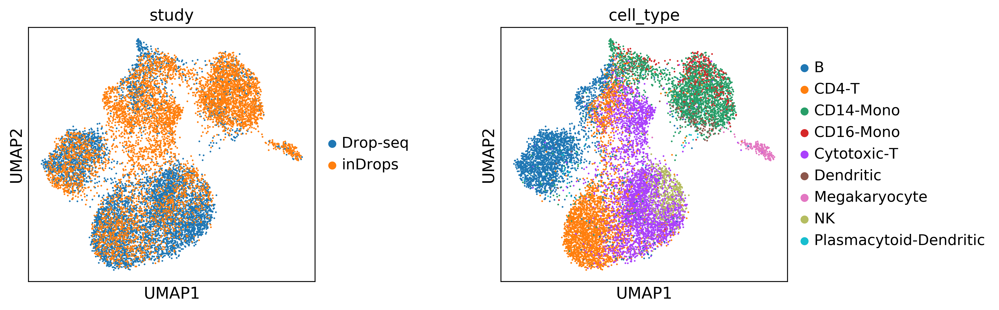

In [32]:
sc.pl.umap(latent_adata, color=[condition_key, cell_type_key], wspace=0.5)

# Let's see what has happened for the target cell type! :)

In [33]:
adata = surgeon.utils.normalize(adata, 
                                 filter_min_counts=False, 
                                 normalize_input=False, 
                                 size_factors=True,
                                 logtrans_input=True,
                                 n_top_genes=5000,
                                )
adata

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


AnnData object with n_obs × n_vars = 107248 × 1793 
    obs: 'CBC', 'CellType', 'Experiment', 'Method', 'batch', 'bulk_labels', 'cell_type', 'louvain', 'method', 'n_counts', 'n_genes', 'percent_mito', 'study', 'size_factors'
    var: 'ENS-0', 'Name-0', 'gene_ids-1', 'n_counts-2', 'gene_ids-3', 'n_cells-3', 'highly_variable-3', 'means-3', 'dispersions-3', 'dispersions_norm-3'
    uns: 'cell_type_colors', 'neighbors', 'study_colors'
    obsm: 'X_pca', 'X_umap'

In [34]:
encoder_labels, _ = surgeon.utils.label_encoder(adata, label_encoder=new_network.condition_encoder, condition_key=condition_key)
encoder_labels.shape

(107248, 1)

In [39]:
adata.obs['cell_label'] = 'others'
adata.obs.loc[((adata.obs[cell_type_key].isin(target_cell_types)) & (adata.obs[condition_key].isin(target_conditions))), 'cell_label'] = f"In-sample {target_cell_types[0]}"
adata.obs.loc[((adata.obs[cell_type_key].isin(target_cell_types)) & (~adata.obs[condition_key].isin(target_conditions))), 'cell_label'] = f"Out-of-sample {target_cell_types[0]}"

In [40]:
latent_adata = new_network.to_latent(adata, encoder_labels)
latent_adata

AnnData object with n_obs × n_vars = 107248 × 20 
    obs: 'CBC', 'CellType', 'Experiment', 'Method', 'batch', 'bulk_labels', 'cell_type', 'louvain', 'method', 'n_counts', 'n_genes', 'percent_mito', 'study', 'size_factors', 'cell_label'

In [41]:
sc.pp.neighbors(latent_adata)
sc.tl.umap(latent_adata)

... storing 'cell_label' as categorical


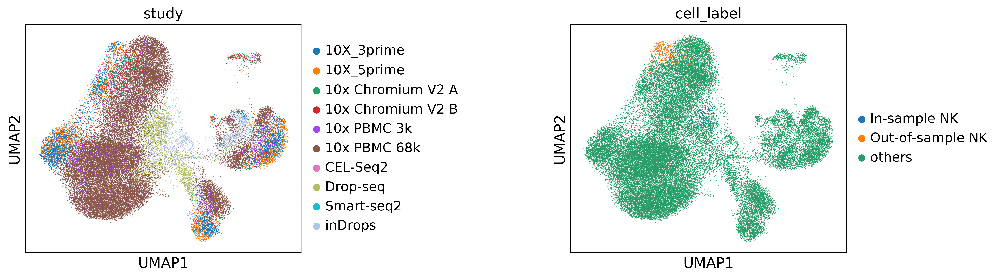

In [42]:
sc.pl.umap(latent_adata, color=[condition_key, "cell_label"], wspace=0.8)